# Mostrar todas las imagenes a usar

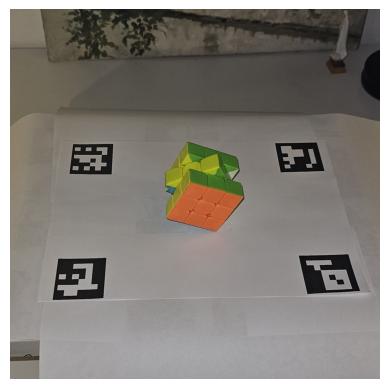

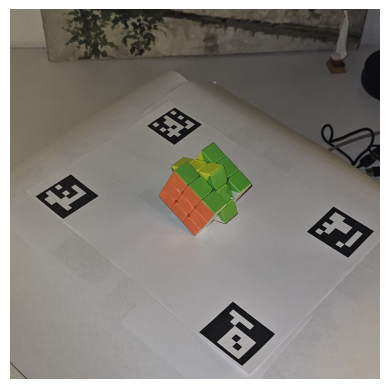

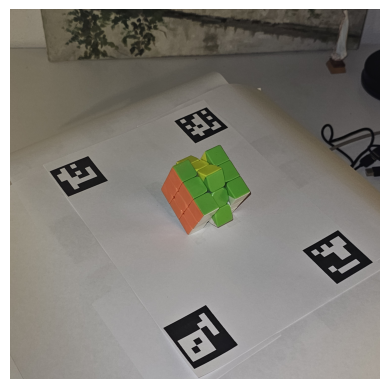

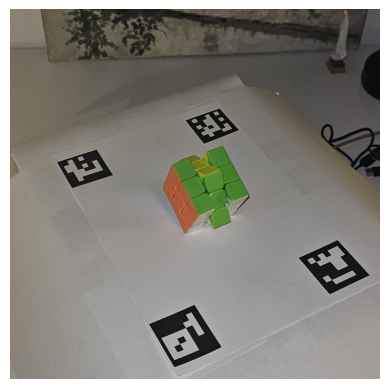

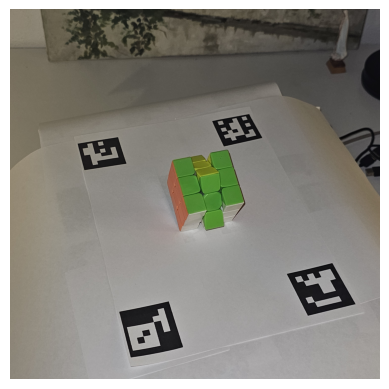

...

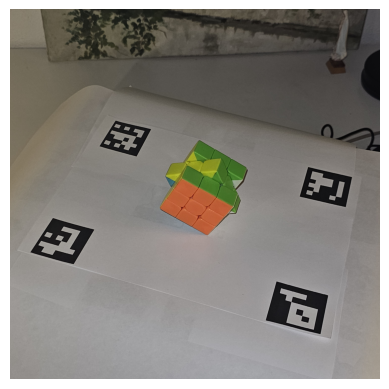

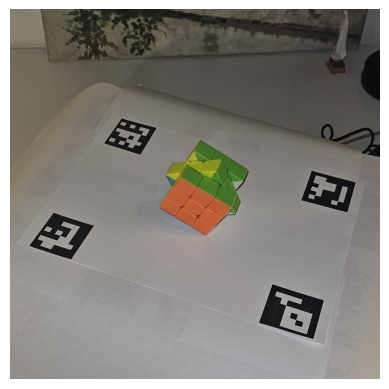

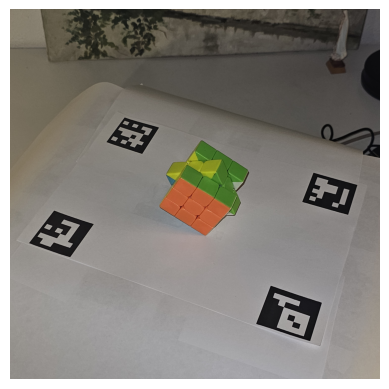

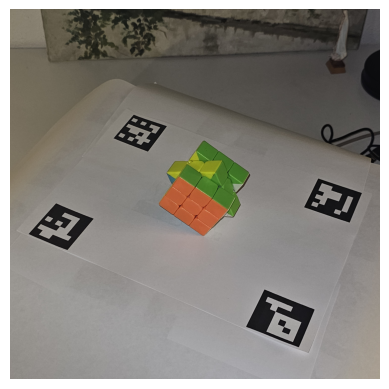

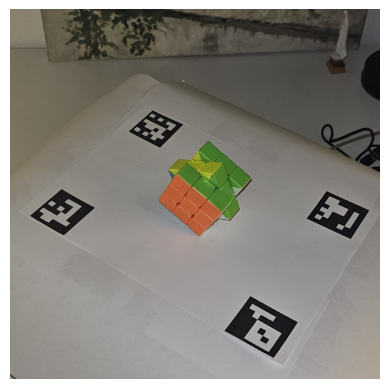

In [1]:
import matplotlib.pyplot as plt
import glob
import numpy as np  # Import numpy for array manipulation

# Specify the path to the images
images_paths = glob.glob('img/cube/*.jpg')

# Loop through all the image paths in the list
plt.figure()
for file_name in images_paths:
    img = plt.imread(file_name)      # Read the image file directly into an array
    img = np.flipud(img)             # Flip the image in the up/down direction
    plt.imshow(img)                  # Display the image
    plt.axis('off')                  # Remove the axes
    plt.show()                       # Show the image


# FUNCIÓN DE CALIBRADO

In [2]:
import numpy as np
import cv2 as cv
import glob
import matplotlib.pyplot as plt
def scanner_calibrate_camera(path='img/calibrate/showcase/angular.png',show_images=False):
    #---------------------------------PARAMETERS
    rows_count = 6
    columns_count = 9
    #---------------------------------
    # termination criteria
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.1)
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((rows_count*columns_count,3), np.float32)
    objp[:,:2] = np.mgrid[0:columns_count,0:rows_count].T.reshape(-1,2)
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.
    #images = glob.glob('angular-1to1/*.jpg')
    images = glob.glob(path)
    for fname in images:
        print("Loading image: "+fname)
        img = cv.imread(fname)
        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        # Find the chess board corners
        ret, corners = cv.findChessboardCorners(gray, (columns_count,rows_count), None)
        # If found, add object points, image points (after refining them)
        if ret == True:
            print(fname+": calibrate success")
            objpoints.append(objp)
            corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
            imgpoints.append(corners2)
            # Draw and display the corners
            cv.drawChessboardCorners(img, (columns_count,rows_count), corners2, ret)
            if show_images:
                plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                plt.axis("off")
                plt.show()
        else:
            print(fname+": chessboard not found")

    ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return ret, mtx, dist, rvecs, tvecs

## showcase

Loading image: img/calibrate/showcase/angular.png
img/calibrate/showcase/angular.png: calibrate success


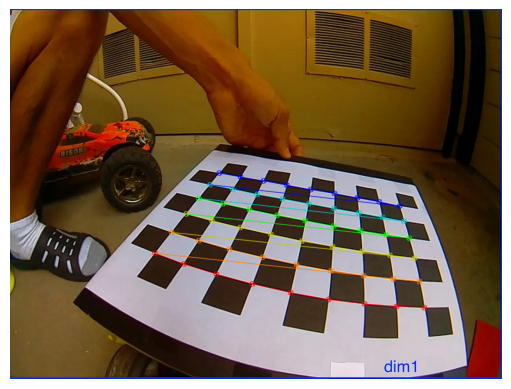

In [239]:
ret, mtx, dist, rvecs, tvecs = scanner_calibrate_camera(show_images=True)

# FUNCIÓN DE POSICIÓN

In [250]:
cv2 = cv
from cv2 import aruco
import pandas as pd
import matplotlib as mpl
from scipy.spatial.transform import Rotation
def get_camera_position(image, ret, mtx, dist, rvecs, tvecs,show_images=False):
    try:
        # 1. Lectura de la imagen
        photo = cv2.imread(image)
        
        # 2. Aplicación de ArUco
        gray = cv2.cvtColor(photo, cv2.COLOR_BGR2GRAY)
        aruco_dict = aruco.getPredefinedDictionary(aruco.DICT_6X6_250)
        parameters =  aruco.DetectorParameters()
        detector = aruco.ArucoDetector(aruco_dict, parameters)
        corners, ids, rejectedImgPoints = detector.detectMarkers(gray)
        photo_markers = aruco.drawDetectedMarkers(photo.copy(), corners, ids)
        if show_images:
            for i in range(len(ids)):
                c = corners[i][0]
                plt.plot([c[:, 0].mean()], [c[:, 1].mean()], "o", label = "id={0}".format(ids[i]))
            plt.imshow(photo)
            plt.show() 
        # 3. Lectura de ArUco
        def quad_area(data):
            l = data.shape[0]//2
            corners = data[["c1", "c2", "c3", "c4"]].values.reshape(l, 2,4)
            c1 = corners[:, :, 0]
            c2 = corners[:, :, 1]
            c3 = corners[:, :, 2]
            c4 = corners[:, :, 3]
            e1 = c2-c1
            e2 = c3-c2
            e3 = c4-c3
            e4 = c1-c4
            a = -.5 * (np.cross(-e1, e2, axis = 1) + np.cross(-e3, e4, axis = 1))
            return a
    
        corners2 = np.array([c[0] for c in corners])
    
        data = pd.DataFrame({"x": corners2[:,:,0].flatten(), "y": corners2[:,:,1].flatten()},
                           index = pd.MultiIndex.from_product( 
                                   [ids.flatten(), ["c{0}".format(i )for i in np.arange(4)+1]], 
                               names = ["marker", ""] ))
    
        # print(data.index)  # This will show you all the index keys
    
        data = data.unstack().swaplevel(0, 1, axis = 1).stack()
        data["m1"] = data[["c1", "c2"]].mean(axis = 1)
        data["m2"] = data[["c2", "c3"]].mean(axis = 1)
        data["m3"] = data[["c3", "c4"]].mean(axis = 1)
        data["m4"] = data[["c4", "c1"]].mean(axis = 1)
        data["o"] = data[["m1", "m2", "m3", "m4"]].mean(axis = 1)
        
        # 4. Obtención de esquinas
        aruco1 = list(data.loc[(1, "c1")].values)
        aruco4 = list(data.loc[(4, "c2")].values)
        aruco12 = list(data.loc[(12, "c3")].values)
        aruco9 = list(data.loc[(9, "c4")].values)
        
        # 5. Estimación de la posición
        im = photo
        size = im.shape
    
        imageWidth = size[1]
        imageHeight = size[0]
        imageSize = [imageWidth, imageHeight]
    
        points_2D = np.array([
                                    (aruco1),     (aruco4),
                                    (aruco9),     (aruco12)     
                                ])
    
    
        points_3D = np.array([
                                    (0., 202., 0),  (270., 202., 0),
                                    (0., 0., 0),  (270., 0., 0)    
                                ])
    
        success, rvecs, tvecs = cv2.solvePnP(points_3D, points_2D, mtx, dist, flags=cv2.SOLVEPNP_ITERATIVE)
    
        np_rodrigues = np.asarray(rvecs[:,:],np.float64)
        rmat = cv2.Rodrigues(np_rodrigues)[0]
        camera_position = -np.matrix(rmat).T @ np.matrix(tvecs)
    
        #Test the solvePnP by projecting the 3D Points to camera
        projPoints = cv2.projectPoints(points_3D, rvecs, tvecs, mtx, dist)[0]
    
        for p in points_2D:
         cv2.circle(im, (int(p[0]), int(p[1])), 3, (0,255,0), -1)
    
        for p in projPoints:
         cv2.circle(im, (int(p[0][0]), int(p[0][1])), 3, (255,0,0), -1)
        
        # 6. Estimación de la rotación
    
        r = Rotation.from_rotvec([rvecs[0][0],rvecs[1][0],rvecs[2][0]])
        rot = r.as_euler('xyz', degrees=True)
    
        # 7.Resultados finales
        
        tx = float(camera_position[0, 0])
        ty = float(camera_position[1, 0])
        tz = float(camera_position[2, 0])

    
        rx = round(180-rot[0],5) 
        ry = round(rot[1],5) 
        rz = round(rot[2],5)
        
        position = [[tx], [ty], [tz]]
        rotation = [rx, ry, rz]
        R, _ = cv2.Rodrigues(rvecs)
        return position, R , [
                                    (aruco1),     (aruco4),
                                    (aruco9),     (aruco12)     
                                ]
    except:
        return [], [] , []

Loading image: img/calibrate/1.jpg
img/calibrate/1.jpg: calibrate success


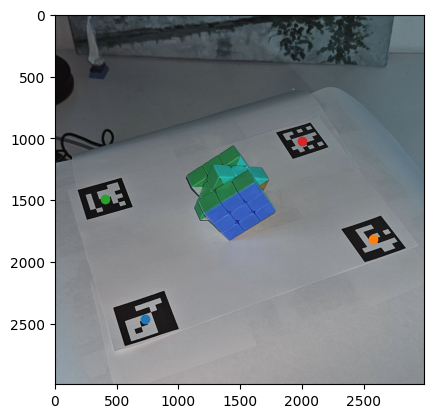

Posición: [[89.34224219956717], [-56.78186569903217], [206.63170523798692]]
Rotación: [[ 0.92456485 -0.38067504  0.01632023]
 [-0.29100736 -0.73313663 -0.61467503]
 [ 0.2459564   0.56355762 -0.7886116 ]]
[[182.0, 1424.0], [2064.0, 877.0], [565.0, 2684.0], [2837.0, 1893.0]]


In [251]:
image_name = "img/cube/7.jpg"
calibration_image = "img/calibrate/1.jpg"
ret, mtx, dist, rvecs, tvecs = scanner_calibrate_camera(calibration_image)
position, rotation , arucos = get_camera_position(image_name, ret, mtx, dist, rvecs, tvecs, show_images=True)

print("Posición:", position)
print("Rotación:", rotation)
print(arucos)

# Siluetas

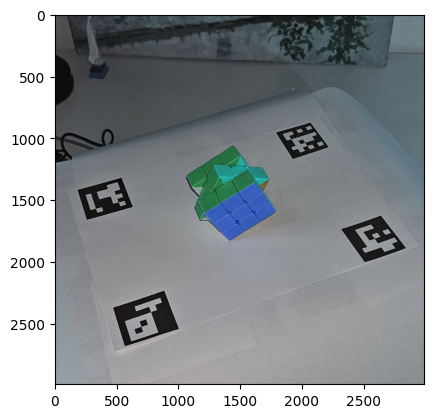

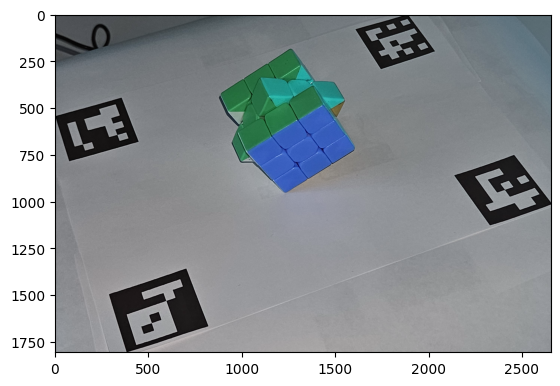

Borders(top=877, bottom=308, left=182, right=155)


In [206]:
import cv2 as cv
import numpy as np


from collections import namedtuple

def trim_image_by_points(image, points_in_image, margin=[0,0,0,0]):
    # Define a named tuple type for borders
    Borders = namedtuple('Borders', ['top', 'bottom', 'left', 'right'])
    
    # Convert points to a numpy array if it isn't already
    points = np.array(points_in_image)

    # Calculate the minimum and maximum x and y coordinates
    min_x = np.min(points[:, 0])
    max_x = np.max(points[:, 0])
    min_y = np.min(points[:, 1])
    max_y = np.max(points[:, 1])

    # Calculate borders
    top_border = int(min_y - margin[0])
    bottom_border = int(image.shape[0] - max_y - margin[1])
    left_border = int(min_x - margin[2])
    right_border = int(image.shape[1] - max_x - margin[3])

    # Trim the image using calculated coordinates
    trimmed_image = image[top_border:int(image.shape[0] - bottom_border),
                          left_border:int(image.shape[1] - right_border)]

    # Create a named tuple for borders
    borders = Borders(top=top_border, bottom=bottom_border, left=left_border, right=right_border)

    return trimmed_image, borders

# Example usage:

image = cv2.imread(image_name) #ejemplo anterior
plt.imshow(image)
plt.show()
result_image, borders = trim_image_by_points(image,arucos,[0,0,0,0])
plt.imshow(result_image)
plt.show()
print(borders)


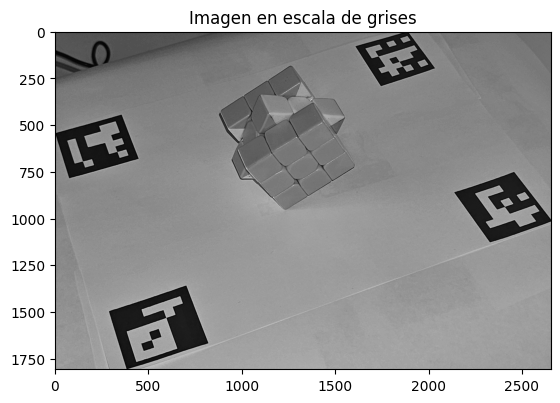

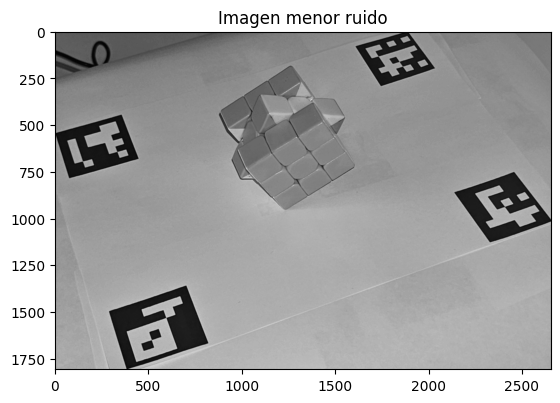

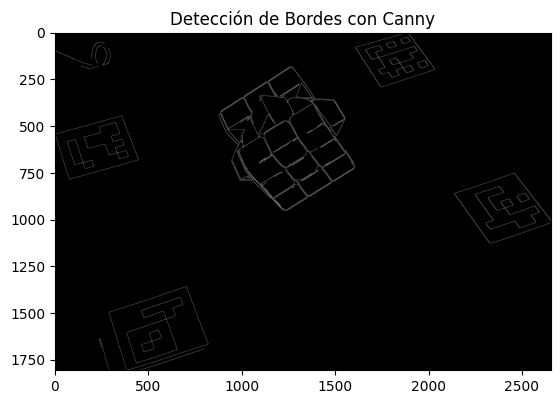

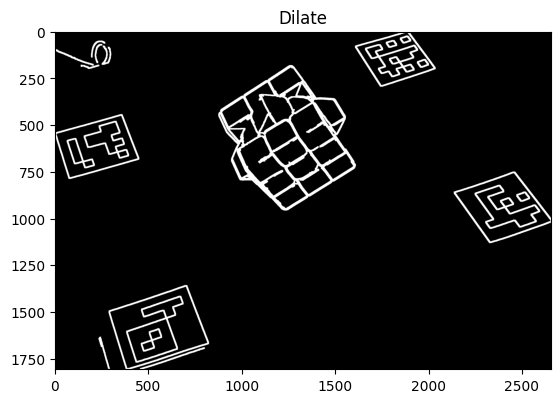

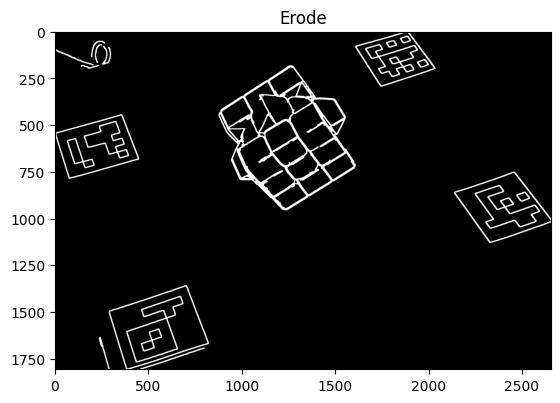

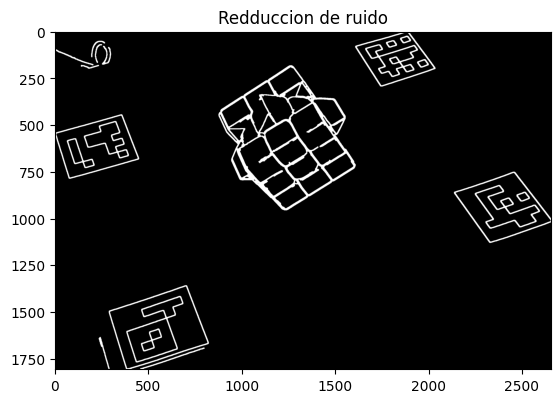

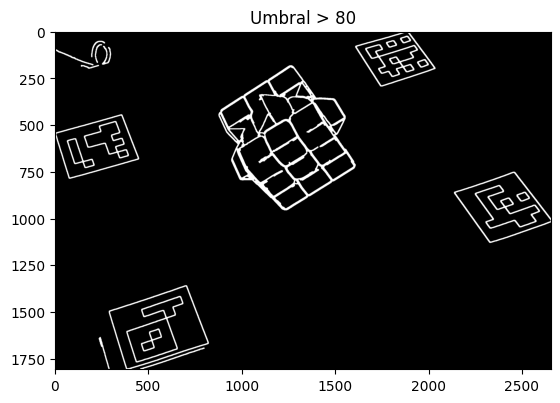

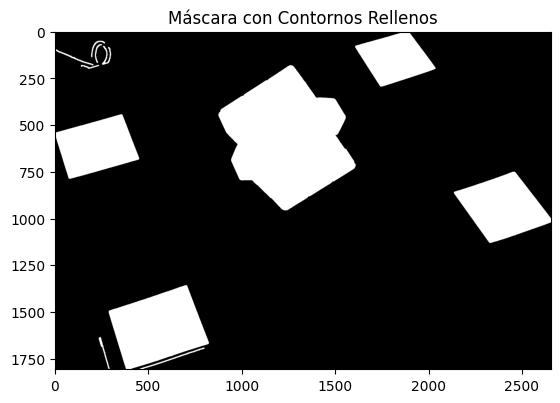

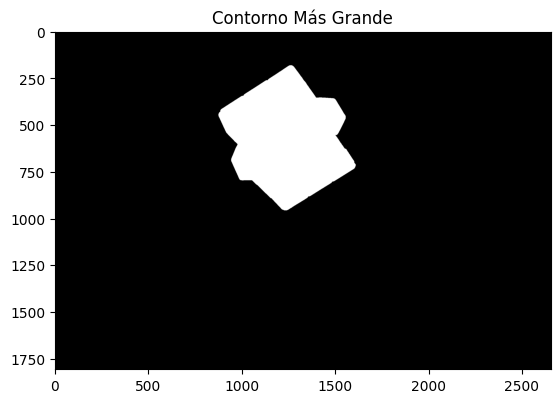

In [232]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def process_image(image,showImages=False):
    # Cargar la imagen

    if image is None:
        return "No se pudo cargar la imagen"
    
    # Convertir a escala de grises
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if showImages:
        plt.imshow(gray, cmap='gray')
        plt.title('Imagen en escala de grises')
        plt.show()
    # Reduccion de ruido
    gray = cv2.GaussianBlur(gray, (7,7), 0)
    if showImages:
        plt.imshow(gray, cmap='gray')
        plt.title('Imagen menor ruido')
        plt.show()

    # Detección de bordes con Canny
    t_lower = 5  # Lower Threshold 
    t_upper = 120  # Upper threshold 
    edges = cv2.Canny(gray, t_lower, t_upper)
    if showImages:
        plt.imshow(edges, cmap='gray')
        plt.title('Detección de Bordes con Canny')
        plt.show()


    # Engrosar los bordes detectados
        # Crear un kernel
    kernel = np.ones((8,8), np.uint8)
    
    # Aplicar la operación de apertura
    dilated_image = cv2.morphologyEx(edges, cv2.MORPH_DILATE, kernel)
    if showImages:
        plt.imshow(dilated_image, cmap='gray')
        plt.title('Dilate')
        plt.show()
    kernel = np.ones((3,3), np.uint8)
    erode_image = cv2.morphologyEx(dilated_image, cv2.MORPH_ERODE, kernel)
    if showImages:
        plt.imshow(erode_image, cmap='gray')
        plt.title('Erode')
        plt.show()
    
    # Aplicar filtro  para eliminar el ruido
    blurred_image = cv2.medianBlur(erode_image, 5)
    if showImages:
        plt.imshow(blurred_image, cmap='gray')
        plt.title('Redduccion de ruido')
        plt.show()

        # Aplicar umbral para mantener solo los valores de gris > 200
    thesh=80
    _, thresholded_image = cv2.threshold(blurred_image, thesh, 255, cv2.THRESH_BINARY)
    
    # Mostrar la imagen umbralizada
    if showImages:
        plt.imshow(thresholded_image, cmap='gray')
        plt.title('Umbral > '+str(thesh))
        plt.show()

    # Encontrar contornos
    contours, _ = cv2.findContours(thresholded_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Dibujar y rellenar contornos
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    if showImages:

        plt.imshow(mask, cmap='gray')
        plt.title('Máscara con Contornos Rellenos')
        plt.show()

    # Encontrar el contorno más grande basado en el área
    largest_contour = max(contours, key=cv2.contourArea)
    
    # Crear una imagen para mostrar el contorno más grande
    largest_contour_image = np.zeros_like(gray)
    cv2.drawContours(largest_contour_image, [largest_contour], -1, (255), thickness=cv2.FILLED)
    
    # Mostrar el contorno más grande
    if showImages:
        plt.imshow(largest_contour_image, cmap='gray')
        plt.title('Contorno Más Grande')
        plt.show()

    return largest_contour_image
    

# Llamada a la función
silhouette = process_image(result_image,showImages=True)


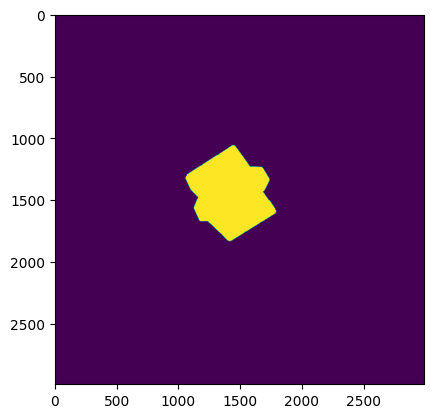

In [233]:
new_image = cv2.copyMakeBorder(silhouette, borders.top, borders.bottom, borders.left, borders.right, 
                                   cv2.BORDER_CONSTANT, value=[0, 0, 0])
plt.imshow(new_image)
plt.show()

# Algoritmo principal de preparacion de imagenes

Recorre las imagenes genera las siluetas y detecta los parametros de la camara para pasarselos al visual hull

Loading image: img/calibrate/1.jpg
img/calibrate/1.jpg: calibrate success


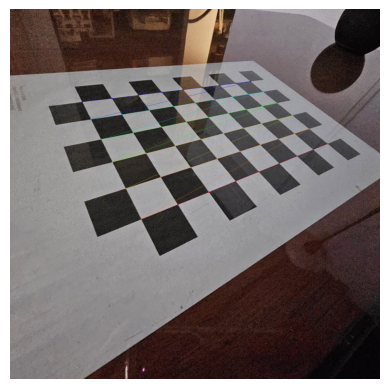

img/cube\1.jpg
No se detectaron todos los marcadores, saltando imagen
img/cube\10.jpg


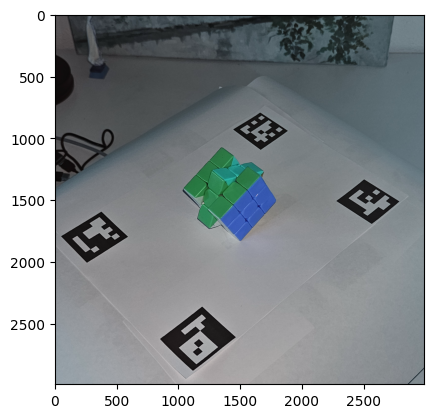

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 6.84018892e-01 -7.29464128e-01 -4.90869862e-04]
 [-4.29559431e-01 -4.02254048e-01 -8.08498841e-01]
 [ 5.89573448e-01  5.53239340e-01 -5.88497564e-01]] t [[-9.831079334572735], [-58.10505449585035], [143.6566545275347]]
img/cube\11.jpg


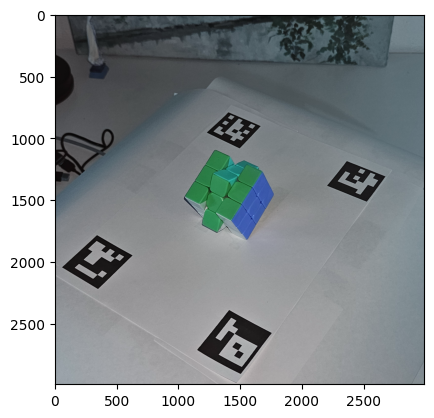

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.52526182 -0.84947632 -0.04989996]
 [-0.57322257 -0.30988584 -0.75854245]
 [ 0.62890056  0.42703717 -0.6497102 ]] t [[-23.912069685156677], [-34.32064310972595], [163.31335506573134]]
img/cube\12.jpg


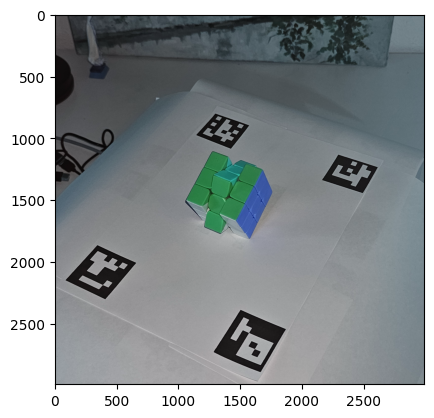

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.44584088 -0.89435366 -0.03684351]
 [-0.64421977 -0.29202653 -0.7068956 ]
 [ 0.62145538  0.33889828 -0.70635767]] t [[-25.14464674554167], [-15.050216010829573], [183.79710918111155]]
img/cube\13.jpg


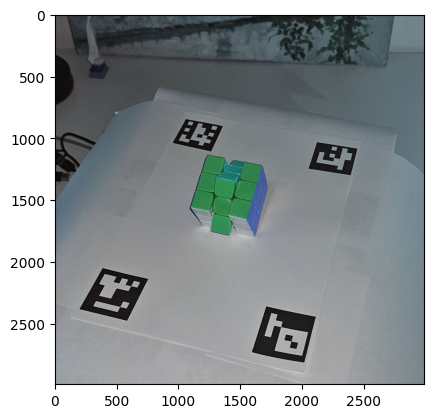

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.24066206 -0.97059162  0.00580383]
 [-0.74711828 -0.18906143 -0.63723626]
 [ 0.61959345  0.14902244 -0.77064665]] t [[-30.257205246340448], [33.926393165070614], [207.7821806268769]]
img/cube\14.jpg


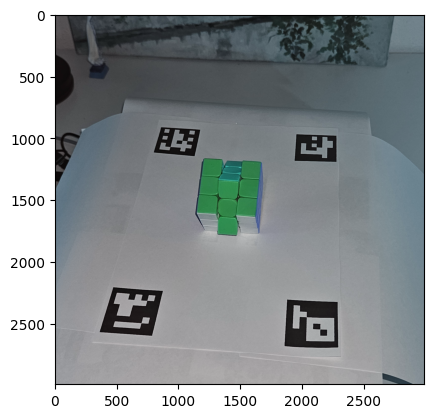

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.05554915 -0.99822588  0.02143333]
 [-0.77750302 -0.0567143  -0.62631664]
 [ 0.62642106  0.01812688 -0.77927407]] t [[-36.59900461853057], [70.62035751604787], [211.65632871544867]]
img/cube\15.jpg


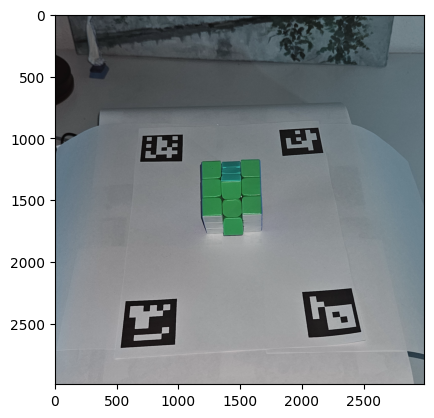

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.09101307 -0.99534742  0.03162478]
 [-0.77872407  0.05133914 -0.62526244]
 [ 0.62072977 -0.08153403 -0.77977353]] t [[-38.59973522429698], [99.60528566823949], [212.25268287157033]]
img/cube\16.jpg


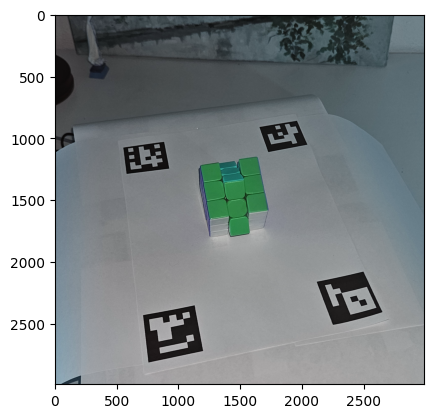

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.25659318 -0.96542713  0.04593906]
 [-0.75227126  0.16964628 -0.63663812]
 [ 0.60683432 -0.19791564 -0.76979316]] t [[-38.496210592993144], [133.78513120846844], [209.33051215489036]]
img/cube\17.jpg


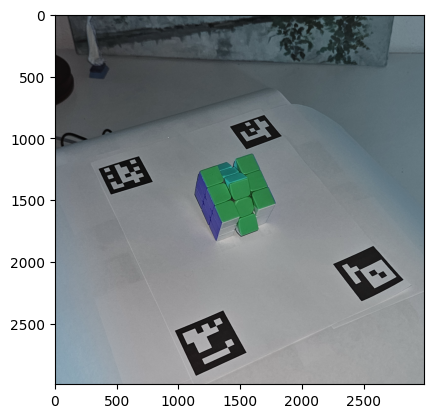

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.49716255 -0.86336207  0.08622837]
 [-0.63829156  0.29660994 -0.71035655]
 [ 0.58771871 -0.40820151 -0.69854008]] t [[-37.07913070440285], [193.73054313007478], [185.3065876341999]]
img/cube\18.jpg


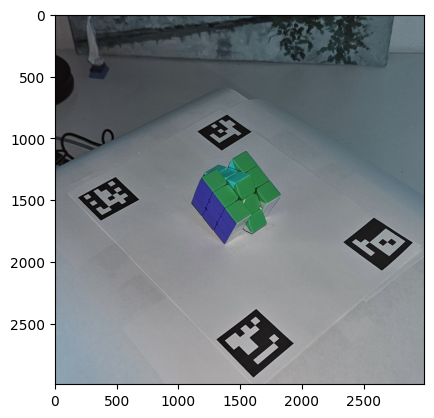

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.70539993 -0.70676582  0.05378673]
 [-0.4414781   0.37872079 -0.81342956]
 [ 0.55453405 -0.59753882 -0.57917125]] t [[-28.30363030674659], [239.163134239493], [142.98101308975893]]
img/cube\19.jpg


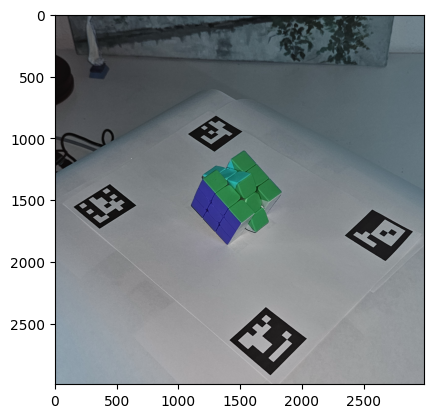

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.75328492 -0.65719683  0.02557657]
 [-0.40300485  0.43049687 -0.80762587]
 [ 0.51975853 -0.61867986 -0.58914031]] t [[-20.917772606359513], [244.7656077801656], [144.99606449572516]]
img/cube\2.jpg
No se detectaron todos los marcadores, saltando imagen
img/cube\20.jpg


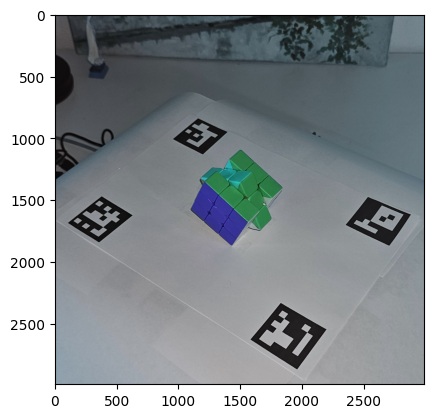

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.83038298 -0.55714583 -0.007255  ]
 [-0.36327143  0.55120916 -0.75113403]
 [ 0.42249021 -0.62109338 -0.66010987]] t [[0.648683047647965], [248.69720914165407], [166.3056004345429]]
img/cube\21.jpg


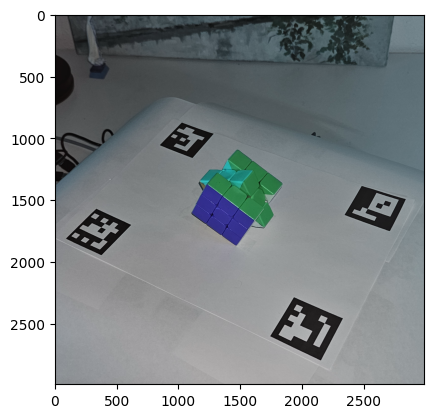

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-8.98365916e-01 -4.39247473e-01 -5.82397045e-04]
 [-3.28123630e-01  6.71971424e-01 -6.63919641e-01]
 [ 2.92016379e-01 -5.96251678e-01 -7.47803698e-01]] t [[34.48070008450083], [246.37215193071634], [194.45920513874017]]
img/cube\22.jpg


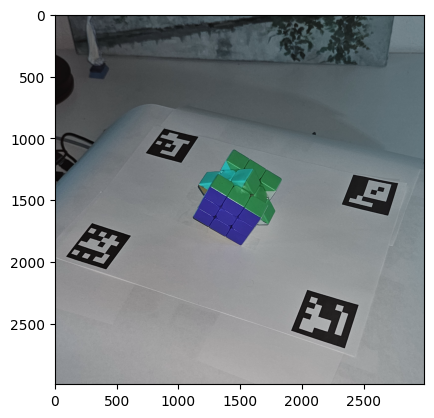

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.94995739 -0.31222655  0.00977408]
 [-0.2488167   0.73737238 -0.62799063]
 [ 0.18886821 -0.5989963  -0.77815952]] t [[63.35451290119578], [248.75369965437397], [202.75609980408296]]
img/cube\23.jpg


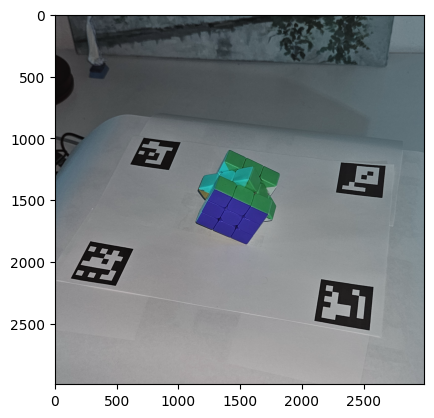

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.98606153 -0.16616763  0.00842524]
 [-0.13583381  0.77474677 -0.61750839]
 [ 0.09608248 -0.6100457  -0.78651917]] t [[89.40415984734628], [253.29216522104804], [203.46943439544097]]
img/cube\24.jpg


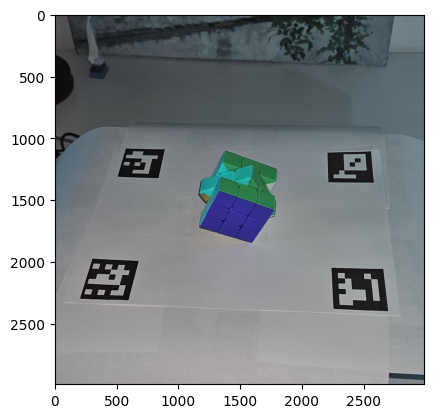

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-9.99492368e-01 -3.18589998e-02  9.91416306e-05]
 [-2.52088603e-02  7.88951215e-01 -6.13938510e-01]
 [ 1.94812489e-02 -6.13629354e-01 -7.89353847e-01]] t [[110.78592425818222], [256.2838716919104], [203.0686443040921]]
img/cube\25.jpg


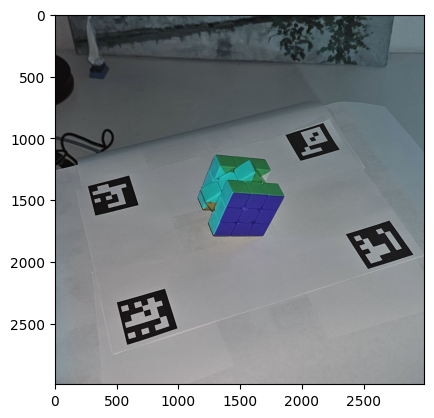

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.94516442  0.32628849 -0.01414361]
 [ 0.27191274  0.76218797 -0.58748018]
 [-0.18090793 -0.55911119 -0.80911495]] t [[167.95982374580066], [251.73418500159838], [210.6981907646809]]
img/cube\26.jpg


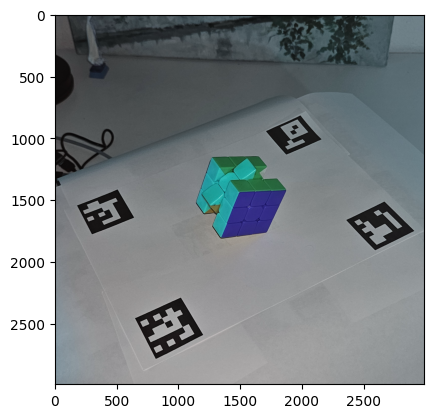

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.87629757  0.4817413  -0.00528019]
 [ 0.39471821  0.71163056 -0.581188  ]
 [-0.27622472 -0.51137782 -0.81375219]] t [[196.35956299190954], [244.64012919376657], [214.4034992118682]]
img/cube\27.jpg


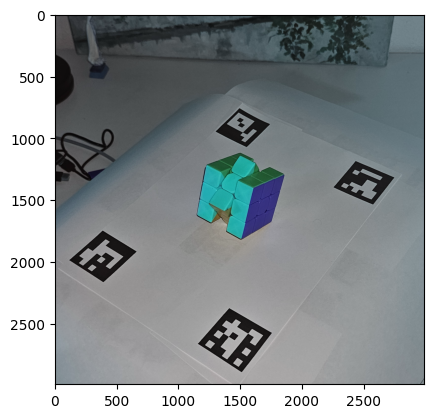

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.56406949  0.82489762 -0.03700715]
 [ 0.58163489  0.36511413 -0.72690614]
 [-0.58611131 -0.43155023 -0.68573897]] t [[287.7253768629436], [232.62026116513178], [173.3451293215153]]
img/cube\28.jpg


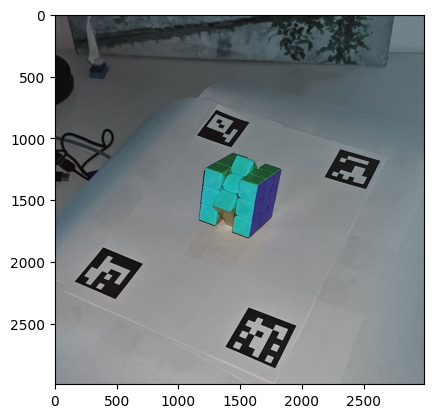

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.42211796  0.90641389 -0.01517507]
 [ 0.691365    0.31105173 -0.65212058]
 [-0.58637092 -0.28576332 -0.75796337]] t [[291.58124255166103], [198.53611968457028], [199.23427780521706]]
img/cube\29.jpg


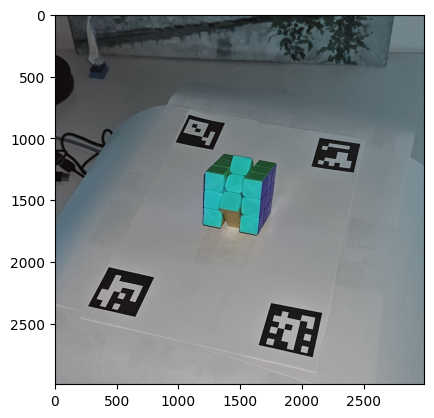

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.23490776  0.97195985  0.01060143]
 [ 0.76309473  0.19116207 -0.6173682 ]
 [-0.60208369 -0.13693468 -0.7866029 ]] t [[300.0391195586514], [159.4599472257785], [210.23553244661713]]
img/cube\3.jpg
No se detectaron todos los marcadores, saltando imagen
img/cube\30.jpg


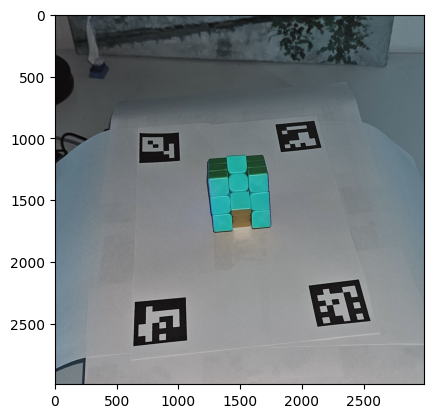

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.13782127  0.98961004  0.04095442]
 [ 0.78351849 -0.08363831 -0.61571374]
 [-0.60589114  0.11694699 -0.78690491]] t [[308.96020736346907], [88.13333751946496], [210.91373464763365]]
img/cube\31.jpg


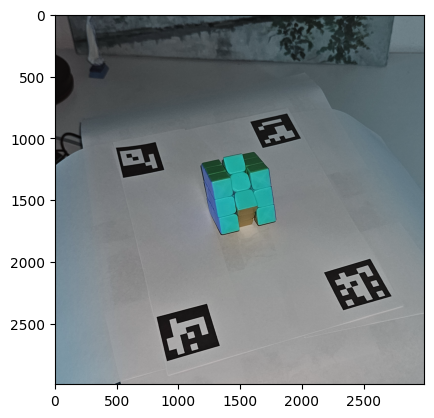

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.33964275  0.9382541   0.06574222]
 [ 0.73457955 -0.22096211 -0.64153615]
 [-0.58739738  0.266186   -0.76427045]] t [[308.0140318223347], [45.49515279636067], [203.4414486099355]]
img/cube\32.jpg


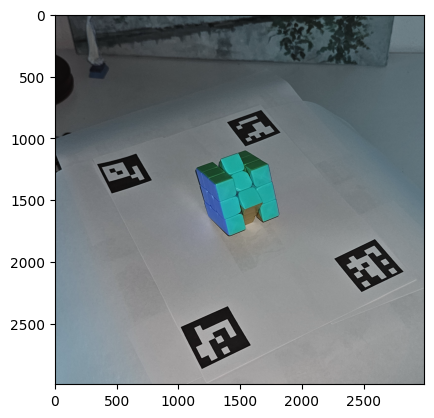

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.51693325  0.85087304  0.09378214]
 [ 0.63310921 -0.3062812  -0.71088998]
 [-0.57615341  0.426857   -0.69702249]] t [[307.2100157810403], [1.3547664319044161], [180.63470705128537]]
img/cube\33.jpg
No se detectaron todos los marcadores, saltando imagen
img/cube\34.jpg


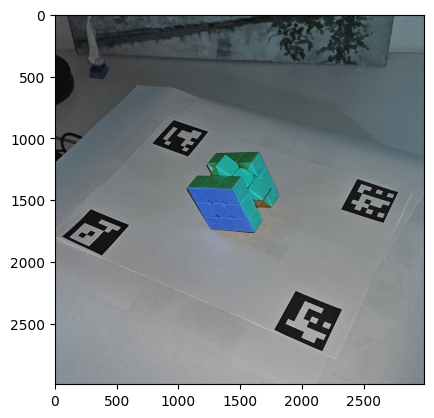

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.91372724  0.40617951  0.01098806]
 [ 0.31234195 -0.68482297 -0.6583768 ]
 [-0.25989429  0.60500885 -0.7526083 ]] t [[231.81696449838898], [-49.07540268262582], [194.0072440213514]]
img/cube\35.jpg
No se detectaron todos los marcadores, saltando imagen
img/cube\36.jpg


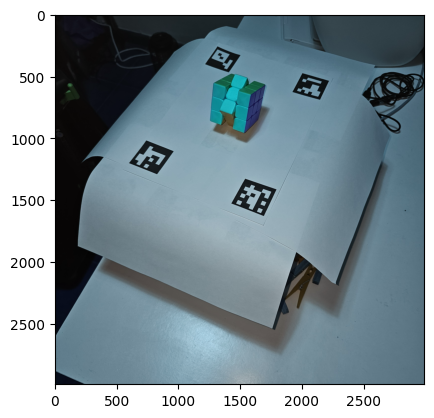

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[-0.39476123  0.91876336  0.00612133]
 [ 0.78387967  0.34026669 -0.51937582]
 [-0.47926635 -0.20023105 -0.85452401]] t [[390.9574837589941], [242.57757663122223], [240.15853477095138]]
img/cube\4.jpg
No se detectaron todos los marcadores, saltando imagen
img/cube\5.jpg


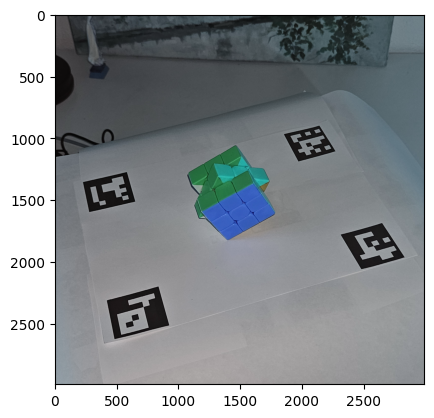

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.94863186 -0.31608963  0.01359886]
 [-0.24164173 -0.75160772 -0.61375493]
 [ 0.20422258  0.57894143 -0.78937948]] t [[101.61037307034874], [-58.38241723919212], [205.70886340223666]]
img/cube\6.jpg


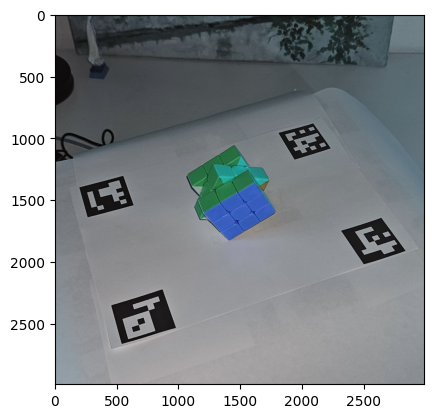

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.93256754 -0.36061653  0.01653803]
 [-0.27492666 -0.73916789 -0.61485459]
 [ 0.23395111  0.56884668 -0.78846708]] t [[92.64728510843014], [-57.34751841605413], [206.3083047047977]]
img/cube\7.jpg


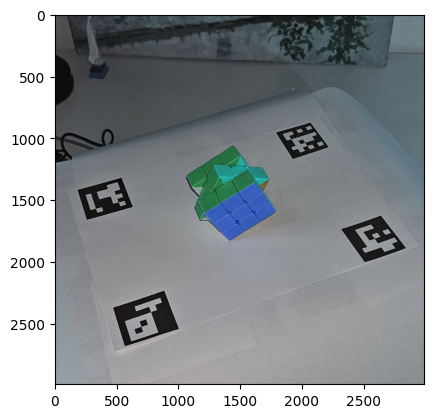

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.92456485 -0.38067504  0.01632023]
 [-0.29100736 -0.73313663 -0.61467503]
 [ 0.2459564   0.56355762 -0.7886116 ]] t [[89.34224219956717], [-56.78186569903217], [206.63170523798692]]
img/cube\8.jpg


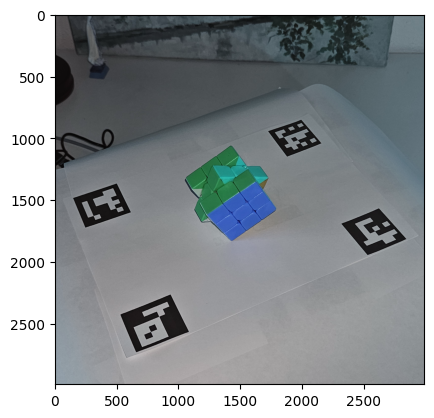

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.89433692 -0.44674524  0.02408658]
 [-0.33453705 -0.70351411 -0.62701903]
 [ 0.29706302  0.55270841 -0.77863148]] t [[73.68304320840649], [-56.377828034988525], [204.79986964963703]]
img/cube\9.jpg


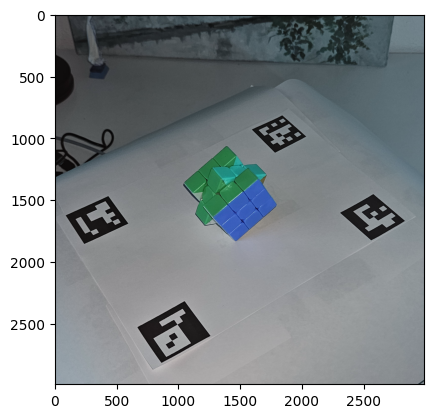

k [[1.85138602e+03 0.00000000e+00 1.63514449e+03]
 [0.00000000e+00 2.08347887e+03 1.53779431e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] R [[ 0.8008381  -0.59737284  0.04247396]
 [-0.38741158 -0.57083557 -0.72391921]
 [ 0.45669532  0.56328718 -0.68857603]] t [[25.44636652017318], [-61.806217221298056], [177.1937244375191]]


In [253]:
import glob
calibration_image_path = "img/calibrate/1.jpg"
images_paths = glob.glob("img/cube/*.jpg")
#1 Parametros de camara
ret, mtx, dist, rvecs, tvecs = scanner_calibrate_camera(calibration_image_path,show_images=True)

#Numero de imagenes exitosas
N=0
#Array de matrices
M=[]
#Imagenes en formato silueta
silhouettes = []
for file_name in images_paths:
    
    #1 Deteccion de arucos
    print(file_name)
    position, rotation , arucos = get_camera_position(file_name, ret, mtx, dist, rvecs, tvecs)
    if len(arucos)<4 : 
        print("No se detectaron todos los marcadores, saltando imagen" )
        continue

    #2 Obtener siluetas
    image = cv.imread(file_name)
    plt.imshow(image)
    plt.show()
    # recorte de imagen por arucos
    result_image, borders = trim_image_by_points(image,arucos,[0,0,0,0])
    # obtencion de la silueta
    silhouette_short = process_image(result_image,showImages=False)
    silhouette_full = cv2.copyMakeBorder(silhouette_short, borders.top, borders.bottom, borders.left, borders.right, 
                                   cv2.BORDER_CONSTANT, value=[0, 0, 0])
    silhouettes.append(silhouette_full)
    K= mtx #parametros de la camara
    R= rotation
    t= position
    print("k",K,"R",R,"t",t)
    M.append(np.matmul(K, np.concatenate([R, t], axis=1)))
    N+=1
    
    
    
    

In [257]:
silhouettes = np.array(silhouettes).transpose(1, 2, 0)

# Visual Hull by egrigokhan

In [258]:
# Define a voxel grid which has the 3D locations of each voxel which can then be projected onto each image
def InitializeVoxels(xlim, ylim, zlim, voxel_size):
  voxels_number = [1, 1, 1]
  voxels_number[0] = np.abs(xlim[1]-xlim[0]) / voxel_size[0]
  voxels_number[1] = np.abs(ylim[1]-ylim[0]) / voxel_size[1]
  voxels_number[2] = np.abs(zlim[1]-zlim[0]) / voxel_size[2]
  voxels_number_act = np.array(voxels_number).astype(int) + 1
  total_number = np.prod(voxels_number_act)

  voxel = np.ones((int(total_number), 4))

  sx = xlim[0]
  ex = xlim[1]
  sy = ylim[0]
  ey = ylim[1]
  sz = zlim[0]
  ez = zlim[1]

  if(ex > sx):
    x_step = voxel_size[0];
  else:
    x_step = -voxel_size[0];

  if(ey > sy):
    y_step = voxel_size[1];
  else:
    y_step = -voxel_size[1];

  if(sz > ez):
    z_step = voxel_size[2];
  else:
    z_step = -voxel_size[2];

  voxel3Dx, voxel3Dy, voxel3Dz = np.meshgrid(np.linspace(sx, ex, voxels_number_act[0]), 
                                             np.linspace(sy, ey, voxels_number_act[1]),
                                             np.linspace(ez, sz, voxels_number_act[2]))
  
  l = 0;
  for z in np.linspace(ez, sz, voxels_number_act[2]):
    for x in np.linspace(sx, ex, voxels_number_act[0]):
      for y in np.linspace(sy, ey, voxels_number_act[1]):
        voxel[l] = [x, y, z, 1] 
        l=l+1

  return voxel, voxel3Dx, voxel3Dy, voxel3Dz, voxels_number

In [259]:
voxel_size = [0.001, 0.001, 0.001] # size of each voxel

# The dimension limits
xlim = [-0.07, 0.02]
ylim = [-0.02, 0.07]
zlim = [-0.07, 0.02]

voxels, voxel3Dx, voxel3Dy, voxel3Dz, voxels_number = InitializeVoxels(xlim, ylim, zlim, voxel_size);

In [260]:
object_points3D = np.copy(voxels).T
voxels[:, 3] = 0 # making the fourth variable of each voxel 0

proj = []

for i in range(N):

  # CAMERA PARAMETERS
  M_ = M[i]

  # PROJECTION TO THE IMAGE PLANE
  points2D = np.matmul(M_, object_points3D)
  points2D = np.floor(points2D / points2D[2, :]).astype(np.int32)
  points2D[np.where(points2D < 0)] = 0; # check for negative image coordinates

  img_size = (silhouettes).shape
  ind1 = np.where(points2D[1, :] >= img_size[0]) # check for out-of-bounds (width) coordinate
  points2D[:, ind1] = 0
  ind1 = np.where(points2D[0, :] >= img_size[1]) # check for out-of-bounds (height) coordinate
  points2D[:, ind1] = 0

  # ACCUMULATE THE VALUE OF EACH VOXEL IN THE CURRENT IMAGE
  voxels[:, 3] += silhouettes[:, :, i].T[points2D.T[:, 0], points2D.T[:, 1]]

  proj.append(points2D)

In [261]:
def ConvertVoxelList2Voxel3D(voxels_number, voxel_size, voxel):
  sx = -(voxels_number[0] / 2) * voxel_size[0]
  ex = voxels_number[0] / 2 * voxel_size[0]

  sy = -(voxels_number[1] / 2) * voxel_size[1]
  ey = voxels_number[1] / 2 * voxel_size[1]
  sz = 0;
  ez = voxels_number[2] * voxel_size[2]
  voxels_number = np.array(voxels_number).astype(np.int32)
  voxel3D = np.zeros((voxels_number[1] + 1, voxels_number[0] + 1, voxels_number[2] + 1));

  l = 0
  z1 = 0
  for z in np.arange(ez, sz, -voxel_size[2]):
      x1 = 0
      for x in np.arange(sx, ex, voxel_size[0]):
          y1 = 0
          for y in np.arange(sy, ey, voxel_size[1]):
              voxel3D[y1, x1, z1] = voxel[l, 3]
              l = l + 1
              y1 = y1 + 1
          x1 = x1 + 1
      z1 = z1 + 1

  return voxel3D

In [262]:
error_amount = 5
maxv = np.max(voxels[:, 3])
iso_value = maxv-np.round(((maxv)/100)*error_amount)-0.5
print('max number of votes:' + str(maxv))
print('threshold for marching cube:' + str(iso_value))

voxel3D = ConvertVoxelList2Voxel3D(np.array(voxels_number), voxel_size, voxels)

max number of votes:255.0
threshold for marching cube:241.5


In [263]:
#!pip install --upgrade PyMCubes
#!pip install pycollada

In [264]:
import numpy as np
import mcubes

# Extract the 0-isosurface
vertices, triangles = mcubes.marching_cubes(voxel3D, iso_value)

# Export the result to sphere.dae
mcubes.export_mesh(vertices, triangles, "cube.dae", "cube")